# Install sort package

In [1]:
!git clone https://github.com/abewley/sort

Cloning into 'sort'...
remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 202 (delta 0), reused 1 (delta 0), pack-reused 198
Receiving objects: 100% (202/202), 1.21 MiB | 1.28 MiB/s, done.
Resolving deltas: 100% (69/69), done.


In [2]:
!pip install -r ./sort/requirements.txt
!cp ./sort/sort.py ./sort.py

     |████████████████████████████████| 184kB 6.0MB/s 
     |████████████████████████████████| 12.5MB 256kB/s 
     |████████████████████████████████| 1.5MB 54.6MB/s 
  Created wheel for filterpy: filename=filterpy-1.4.5-cp37-none-any.whl size=110452 sha256=5966bdfb55f3c05294d4fae5af3a02ea5792d3b96c82f7ed75a031e69e67155b
  Stored in directory: /root/.cache/pip/wheels/c3/0c/dd/e92392c3f38a41371602d99fc77d6c1d42aadbf0c6afccdd02
  Created wheel for lap: filename=lap-0.4.0-cp37-cp37m-linux_x86_64.whl size=1590122 sha256=3a2609fe82665d7d979050885b48e6f6889c538440b2114ae7eec7099e04bbeb
  Stored in directory: /root/.cache/pip/wheels/da/3e/af/eddcd6ffaa27df8d0ddac573758f8953c4e57c64c4c8c8b7d0
Successfully built filterpy lap
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: scikit-image 0.16.2
    Uninstalling scikit-image-0.16.2:
      Successfully uninstalled scikit-image-0.16.2


In [11]:
# we need to remove matplotlib.use('TkAgg') from sort.py

with open('sort.py', 'r') as f:
  lines = f.readlines()
  lines = [line for line in lines if line != "matplotlib.use('TkAgg')"]

with open('sort.py', 'w') as f:
  f.write("\n".join(lines))

# Download images and videos

In [4]:
!wget https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg -q -O traffic.jpg
!wget https://www.jpjodoin.com/urbantracker/dataset/sherbrooke/sherbrooke_video.avi -q -O 1.avi
!wget https://www.jpjodoin.com/urbantracker/dataset/rouen/rouen_video.avi -q -O 2.avi
!wget https://motchallenge.net/sequenceVideos/PETS09-S2L1-raw.webm -q -O PETS09-S2L1.webm
!wget https://motchallenge.net/sequenceVideos/PETS09-S2L2-raw.webm -q -O PETS09-S2L2.webm
!wget https://motchallenge.net/sequenceVideos/ADL-Rundle-8-raw.webm -q -O ADL-Rundle-8.webm
!wget https://motchallenge.net/sequenceVideos/ADL-Rundle-6-raw.webm -q -O ADL-Rundle-6.webm

# Code to play video in colab

In [5]:
!mkdir output_compressed

In [6]:
import os
from IPython.display import HTML

def compress_video(video_path):
  compressed_path = os.path.join("output_compressed", os.path.split(video_path)[-1])
  if os.path.isfile(compressed_path):
    os.remove(compressed_path)
  os.system(f"ffmpeg -i {video_path} -vcodec libx264 -crf 30 {compressed_path}")
  return compressed_path

def play_video(path, width=800):
  path = compress_video(path)
  abspath = os.path.abspath(path)
  filename = os.path.split(abspath)[-1]
  os.system(f'ln -snf {abspath} /usr/local/share/jupyter/nbextensions/{filename}')
  return HTML(f"<video width={width} src='/nbextensions/{filename}' controls/>")

# Function to load data into gpu

In [7]:
import torch

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

def to_device(data, device):
  if isinstance(data, (list, tuple)):
    return [to_device(d, device) for d in data]
  if isinstance(data, dict):
    return {k: to_device(v, device) for (k, v) in data.items()}
  return data.to(device, non_blocking=True)


# Detection and tracking

In [8]:
import torchvision
import cv2
import numpy as np
import torch
from  torchvision.models.utils import load_state_dict_from_url
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection import FasterRCNN


COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

COCO_CATEGORY_TO_INDEX = {n: i for i, n in enumerate(COCO_INSTANCE_CATEGORY_NAMES)}

COLOR_PALLETE = [tuple(np.random.randint(0, 255) for _ in range(3)) for _ in range(10)]

def get_model():
  model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
  model = to_device(model, device)
  return model

model = get_model()

OUTPUT_CATEGORY_NAMES = ['car', 'person', 'motorcycle', 'bicycle', 'bus', 'truck']

CATEGORY_TO_INDEX = {category: COCO_CATEGORY_TO_INDEX[category] for category in OUTPUT_CATEGORY_NAMES}
INDEX_TO_CATEGORY = {COCO_CATEGORY_TO_INDEX[category]: category for category in OUTPUT_CATEGORY_NAMES}
INDICES = INDEX_TO_CATEGORY.keys()

def preprocess_image(image):
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
  image /= 255.0
  image = torch.tensor(image).permute(2, 0, 1)
  return image

def predict(model, image, threshold=0.5):
  model.eval()

  image = preprocess_image(image)
  batch = image.unsqueeze(0)
  batch = to_device(batch, device)
  out = model(batch)[0]

  indices = []

  for i, label in enumerate(out['labels']):
    label = label.item()
    if label in INDICES and out['scores'][i].item() > threshold:
      indices.append(i)
  
  return {
    'boxes': out['boxes'][indices],
    'labels': out['labels'][indices],
    'scores': out['scores'][indices],
  }

def draw_detections(image, detections):
  boxes = detections['boxes']
  for i, box in enumerate(boxes):
    topleft = (int(box[0]), int(box[1]))
    bottomright = (int(box[2]), int(box[3]))
    image = cv2.rectangle(image, topleft, bottomright, (0, 255, 0))
  return image

def draw_box_with_text(image, box, text, color=(0, 255, 0), textcolor=(0, 0, 0), fontscale=0.3, thickness=1):
  x1, y1, x2, y2 = [int(v) for v in box]
  
  topleft = (x1, y1)
  bottomright = (x2, y2)

  image = cv2.rectangle(image, topleft, bottomright, color)

  retval, baseline = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, fontscale, thickness)
  w, h = retval

  image = cv2.rectangle(image, (x1, int(y1-h-baseline)), (x1+w, y1), color, -1)
  image = cv2.putText(image, text, topleft, cv2.FONT_HERSHEY_SIMPLEX, fontscale, textcolor, thickness)
  # cv2.putText()
  return image

def draw_tracker_detections(image, detections, path, fontscale=0.3):
  for i, detection in enumerate(detections):
    detection = [int(v) for v in detection]
    x1, y1, x2, y2, id = detection
    color = COLOR_PALLETE[id%len(COLOR_PALLETE)]
    image = draw_box_with_text(image, (x1, y1, x2, y2), f'id {id}', fontscale=fontscale, color=color)
    if id in path:
      image = draw_path(image, path[id], color, thickness=2)
    # topleft = (x1, y1)
    # bottomright = (x2, y2)
    # image = cv2.rectangle(image, topleft, bottomright, (0, 255, 0))
    # image = cv2.putText(image, f'ID: {id}', topleft, cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 255, 0))
  return image

def draw_path(image, path, color, thickness=3):
  if len(path) < 2:
    return image

  points = [[
    int(point[0] + ((point[2]-point[0])/2)), 
    int(point[1] + ((point[3]-point[1])))
   ] for point in path]
  points = np.array(points, dtype=np.int32)
  points.reshape((-1, 1, 2))
  points = [points]
  image	=	cv2.polylines(image, points, 0, color, thickness)
  return image

def update_path(path, tracker_detections):
  for detection in tracker_detections:
    x1, y1, x2, y2, id = [int(v) for v in detection]
    if id not in path:
      path[id] = []
    path[id].append((x1, y1, x2, y2))
  return path

def transform_detections_for_tracker(detections):
  return np.hstack((
      detections['boxes'].detach().cpu().numpy(),
      detections['scores'].detach().cpu().numpy().reshape(-1, 1)        
  ));

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


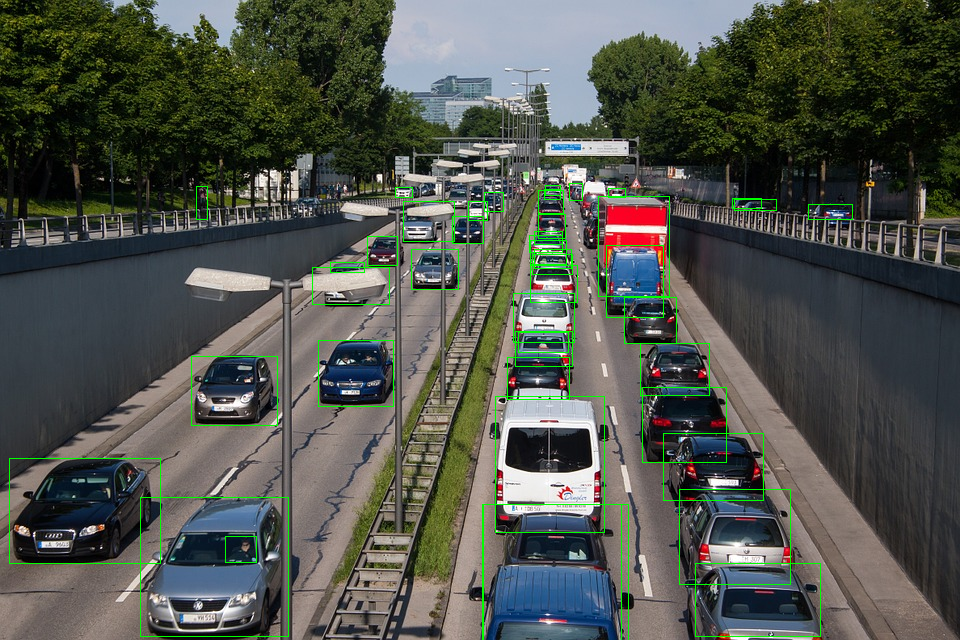

In [9]:
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread('./traffic.jpg')
detections = predict(model, image)
image = draw_detections(image, detections)
cv2_imshow(image)

In [12]:
import cv2
from google.colab.patches import cv2_imshow
import sort

# video input
# video_file = 'PETS09-S2L1.webm'
video_file = '1.avi'
cap = cv2.VideoCapture(video_file)

# tracker
mot_tracker = sort.Sort()

# video output
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
if cap.isOpened():
  video_res = (
      int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),
      int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)),
  )
  out = cv2.VideoWriter('output.mp4', fourcc, 20.0, video_res)

i = 0

# dict {id -> center coordinates of bounding box}
path = {}

while cap.isOpened():

  ret, frame = cap.read()

  if not ret:
    break

  i += 1

  detections = predict(model, frame)

  tracker_detections = transform_detections_for_tracker(detections)

  tracker_bbs_ids = mot_tracker.update(tracker_detections)

  path = update_path(path, tracker_bbs_ids)

  frame = draw_tracker_detections(frame, tracker_bbs_ids, path, fontscale=0.4)
  out.write(frame)

cap.release()
out.release()

In [13]:
play_video('./output.mp4')